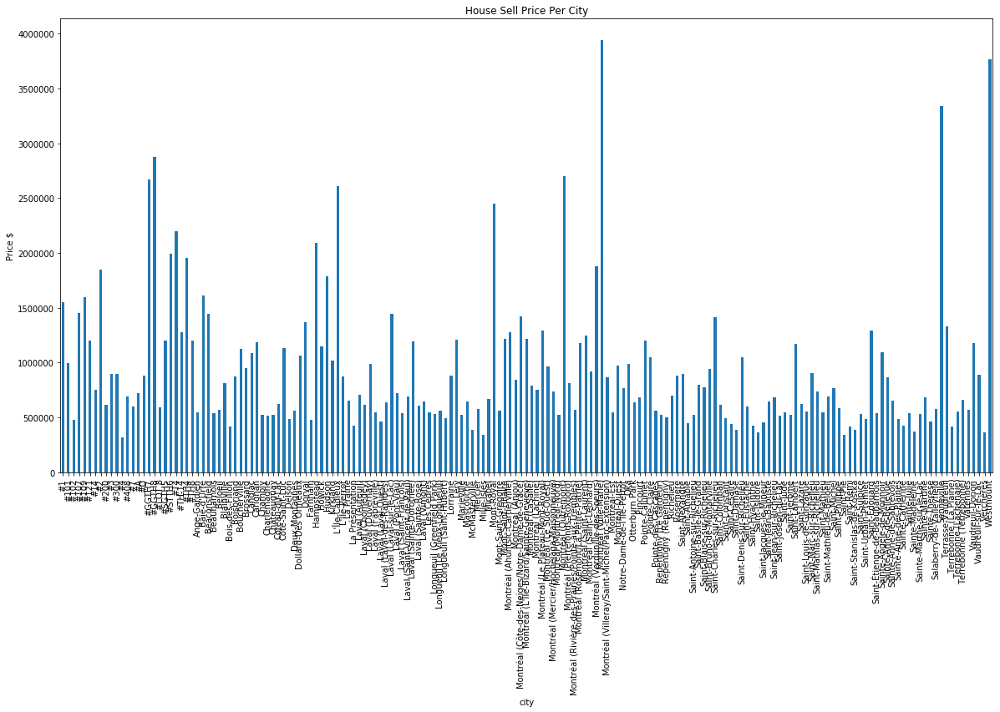

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

home_and_apt_sell = pd.read_csv("real_estate_realtor_ca_montreal_page9.csv", header=0, thousands=',')

plt.figure(figsize=(20,10))

is_home_sell = (home_and_apt_sell['type'] == 'House')

plt.title('House Sell Price Per City')
plt.ylabel('Price $')
home_and_apt_sell[is_home_sell].groupby('city')['price'].mean().plot(kind='bar')

IndexError: index 0 is out of bounds for axis 0 with size 0

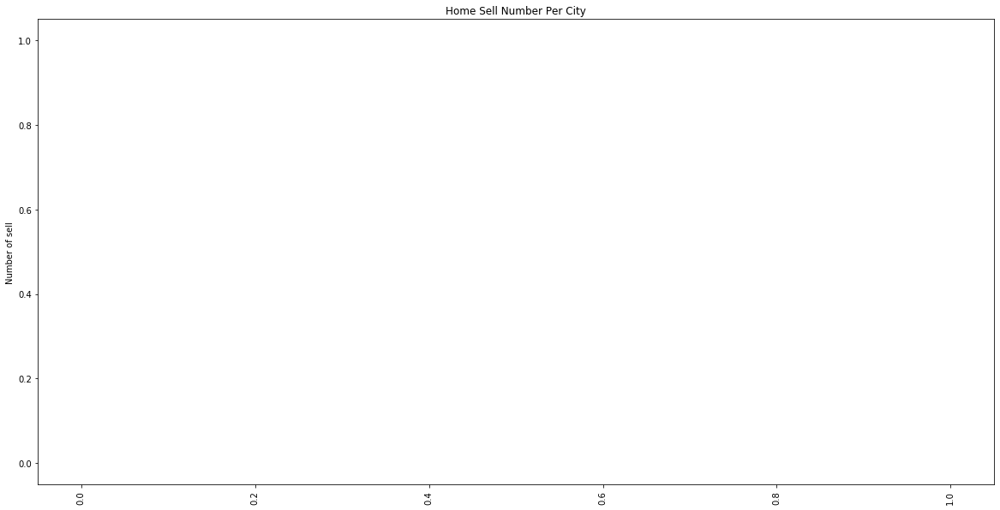

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

home_and_apt_sell = pd.read_csv("real_estate_realtor_ca_montreal_page9.csv", header=0, thousands=',')

plt.figure(figsize=(20,10))

is_home_sell = (home_and_apt_sell['type'] == 'Home')

plt.title('Home Sell Number Per City')
plt.ylabel('Number of sell')
home_and_apt_sell[is_home_sell].groupby('city')['price'].count().plot(kind='bar')

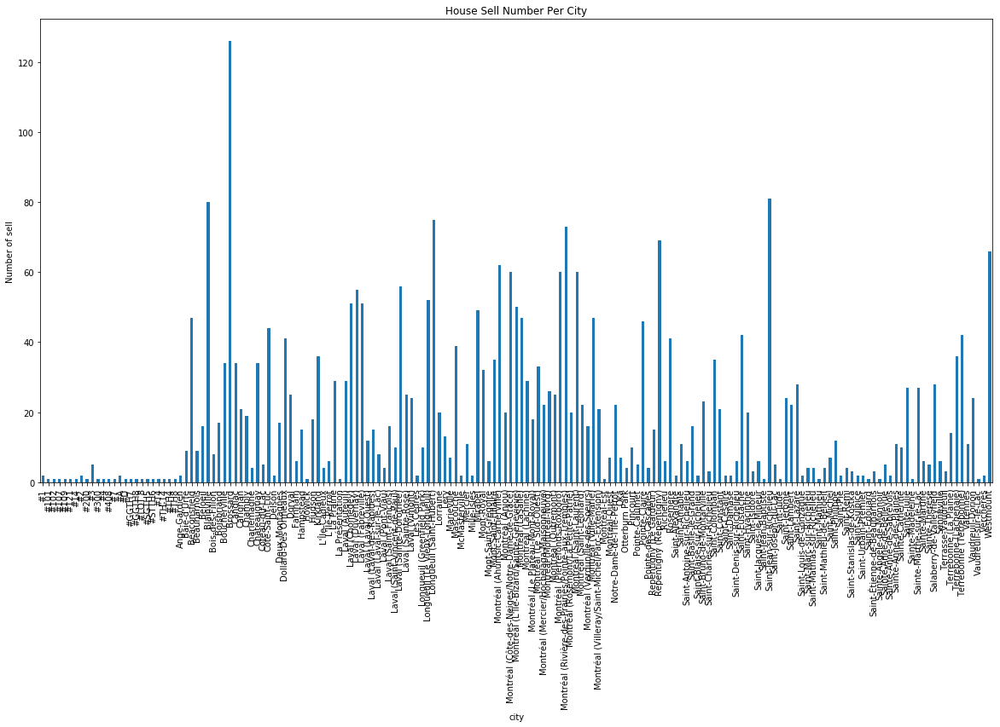

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

home_and_apt_sell = pd.read_csv("real_estate_realtor_ca_montreal_page9.csv", header=0, thousands=',')

plt.figure(figsize=(20,10))

is_home_sell = (home_and_apt_sell['type'] == 'House')

plt.title('House Sell Number Per City')
plt.ylabel('Number of sell')
home_and_apt_sell[is_home_sell].groupby('city')['price'].count().plot(kind='bar')

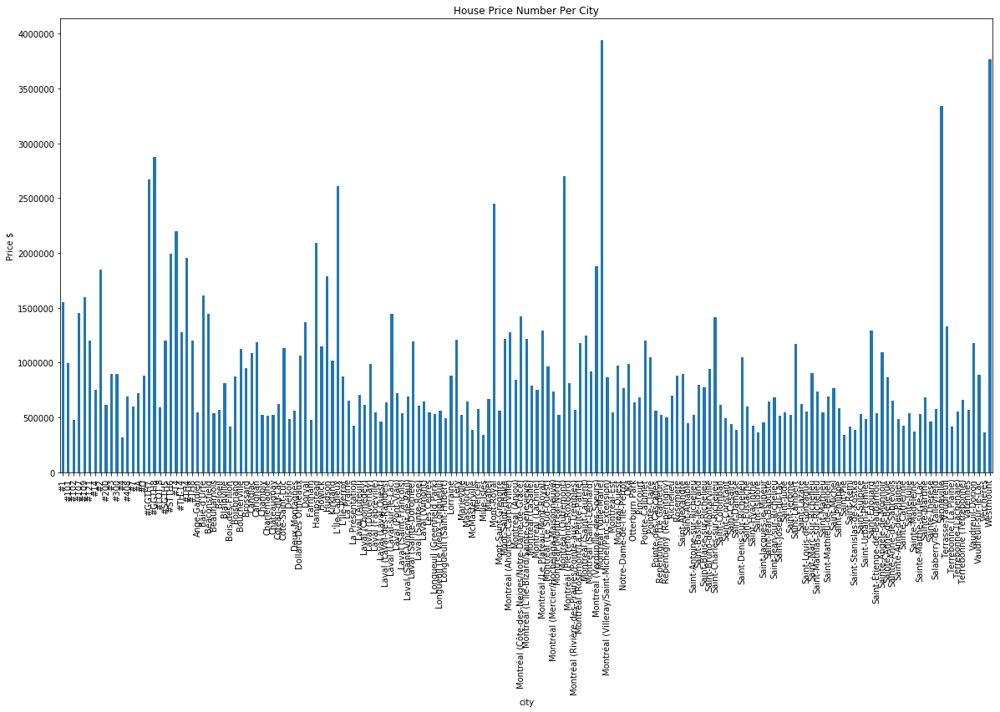

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

home_and_apt_sell = pd.read_csv("real_estate_realtor_ca_montreal_page9.csv", header=0, thousands=',')

plt.figure(figsize=(20,10))

is_home_sell = (home_and_apt_sell['type'] == 'House')

plt.title('House Price Number Per City')
plt.ylabel('Price $')
home_and_apt_sell[is_home_sell].groupby('city')['price'].mean().plot(kind='bar')

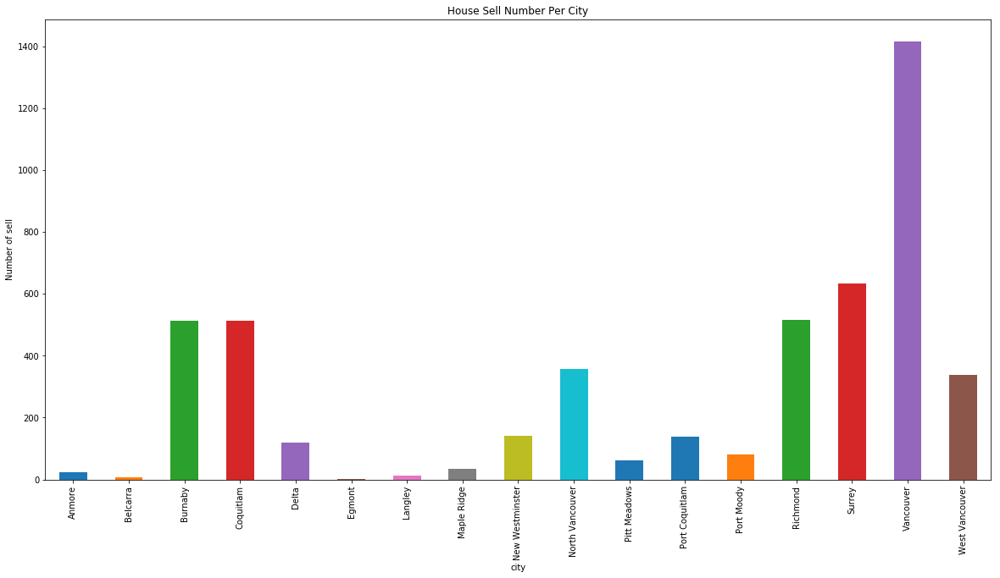

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

home_and_apt_sell = pd.read_csv("real_estate_realtor_ca_montreal_page9.csv", header=0)

plt.figure(figsize=(20,10))

is_home_sell = (home_and_apt_sell['type'] == 'House')

plt.title('House Sell Number Per City')
plt.ylabel('Number of sell')
home_and_apt_sell[is_home_sell].groupby('city')['price'].count().plot(kind='bar')

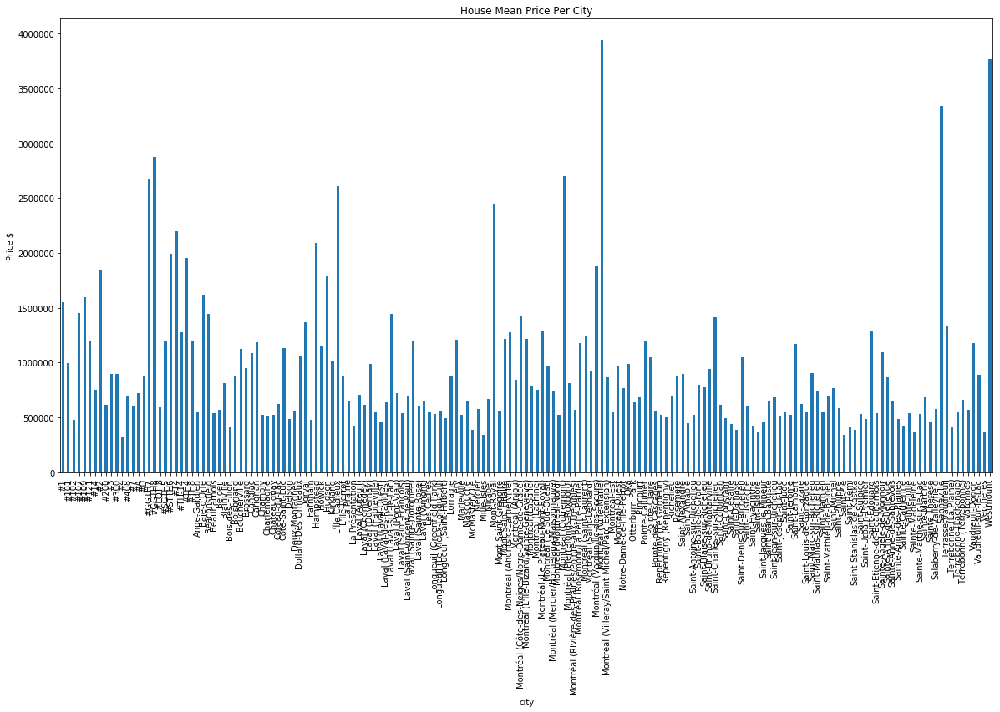

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

home_and_apt_sell = pd.read_csv("real_estate_realtor_ca_montreal_page9.csv", header=0, thousands=',')

plt.figure(figsize=(20,10))

is_home_sell = (home_and_apt_sell['type'] == 'House')

plt.title('House Mean Price Per City')
plt.ylabel('Price $')
home_and_apt_sell[is_home_sell].groupby('city')['price'].mean().plot(kind='bar')

In [9]:
import folium
from folium import plugins
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

home_and_apt_sell = pd.read_csv("real_estate_realtor_ca_montreal_page9.csv", header=0, thousands=',')
is_home_sell = (home_and_apt_sell['type'] == 'House') # & (home_and_apt_sell['bedrooms'] == 5)
home_sell = home_and_apt_sell[is_home_sell]

m = folium.Map([45.80029, -72.89212], zoom_start=10)

# mark each station as a point
for index, row in home_sell.iterrows():
    folium.CircleMarker([row['latitude'], row['longitude']],
                        radius=1,
                        #popup=row['listing id'],
                        popup=folium.Popup('<a href="' + row["url"] + '"target="_blank">$' + "{:,}".format(row["price"]) + '</a>'),
                        fill_color="#3db7e4", # divvy color
                       ).add_to(m)
    
m

In [10]:
import folium
from folium import plugins
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

home_and_apt_sell = pd.read_csv("real_estate_realtor_ca_montreal_page9.csv", header=0, thousands=',')
#is_home_sell = (home_and_apt_sell['type'] == 'House') & (home_and_apt_sell['city'] == 'Burnaby') & (home_and_apt_sell['bedrooms'] == 5)
is_home_sell = (home_and_apt_sell['type'] == 'House') # & (home_and_apt_sell['bedrooms'] == 5)
home_sell = home_and_apt_sell[is_home_sell]

m = folium.Map([45.80029, -72.89212], zoom_start=10)

# mark each station as a point
for index, row in home_sell.iterrows():
    folium.CircleMarker([row['latitude'], row['longitude']],
                        radius=1,
                        #popup=row['listing id'],
                        popup=folium.Popup('<a href="' + row["url"] + '"target="_blank">$' + "{:,}".format(row["price"]) + '</a>'),
                        fill_color="#3db7e4", # divvy color
                       ).add_to(m)
    
# convert to (n, 2) nd-array format for heatmap
stationArr = home_sell[['latitude', 'longitude']].values

# plot heatmap
m.add_child(plugins.HeatMap(stationArr, radius=15))
    
m